# Objective

Perform Exploratory Data Analysis on Singapore housing price dataset from [Kaggle](https://www.kaggle.com/competitions/cs5228-2022-semester-1-final-project/data)

# Preparation

## Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
import plotly.graph_objects as go
init_notebook_mode(connected = True)
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Data Preparation and Description

## Import raw data

In [2]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")
commercial_df = pd.read_csv("auxiliary-data/sg-commerical-centres.csv")
mrt_df = pd.read_csv("auxiliary-data/sg-mrt-stations.csv")
school_df = pd.read_csv("auxiliary-data/sg-secondary-schools.csv")
shopmall_df = pd.read_csv("auxiliary-data/sg-shopping-malls.csv")
subzone_df = pd.read_csv("auxiliary-data/sg-subzones.csv")

## Import custom functions file

In [3]:
pd.set_option("display.max_columns",None)
print(train_df.shape)
train_df.head(2)

(20254, 21)


,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
0,122881,hdb flat for sale in 866 yishun street 81,sembawang / yishun (d27),866 yishun street 81,hdb 4 rooms,NaN,1988.0,3.0,2.0,1115,NaN,unspecified,NaN,116.0,https://www.99.co/singapore/hdb/866-yishun-str...,1.414399,103.837196,0,yishun south,yishun,514500.0
1,259374,hdb flat for sale in 506b serangoon north aven...,hougang / punggol / sengkang (d19),hdb-serangoon estate,hdb,99-year leasehold,1992.0,4.0,2.0,1575,NaN,unspecified,"1, 2, 3, 4, 5, 6 br",NaN,https://www.99.co/singapore/hdb/hdbserangoon-e...,1.372597,103.875625,0,serangoon north,serangoon,995400.0


In [4]:
print(test_df.shape)
test_df.head(2)

(6966, 20)


,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area
0,777912,1 bed condo for sale in the gazania,17 how sun drive,the gazania,condo,freehold,2022.0,1.0,1.0,463,NaN,unfurnished,"studio, 1, 2, 3, 4, 5 br",250.0,https://www.99.co/singapore/condos-apartments/...,1.344334,103.878690,0,upper paya lebar,serangoon
1,936612,3 bed condo for sale in vue 8 residence,95 pasir ris heights,vue 8 residence,Condo,99-year leasehold,2017.0,3.0,3.0,1033,high,unspecified,"studio, 1, 2, 3, 4, 5 br",463.0,https://www.99.co/singapore/condos-apartments/...,1.380281,103.943878,0,pasir ris west,pasir ris


In [5]:
print(commercial_df.shape)
commercial_df.head(2)

(38, 6)


,name,type,lat,lng,subzone,planning_area
0,Central Business District,CR,1.286768,103.854529,clifford pier,downtown core
1,Jurong Lake District,CR,1.334085,103.734513,lakeside (business),jurong east


In [6]:
print(mrt_df.shape)
mrt_df.head(2)

(151, 8)


,code,line,name,opening_year,lat,lng,subzone,planning_area
0,cc1,cc,dhoby ghaut,2010,1.298912,103.846293,dhoby ghaut,museum
1,cc2,cc,bras basah,2010,1.296862,103.850667,bras basah,museum


In [7]:
print(school_df.shape)
school_df.head(2)

(148, 5)


,name,lat,lng,subzone,planning_area
0,Admiralty Secondary School,1.445912,103.802908,woodlands east,woodlands
1,Ahmad Ibrahim Secondary School,1.436095,103.830055,yishun west,yishun


In [8]:
print(shopmall_df.shape)
shopmall_df.head(2)

(165, 5)


,name,lat,lng,subzone,planning_area
0,10 AM,1.275568,103.863591,marina south,marina south
1,313@Somerset,1.301013,103.838540,somerset,orchard


In [9]:
print(subzone_df.shape)
subzone_df.head(2)

(331, 4)


,name,area_size,population,planning_area
0,ang mo kio town centre,0.3169,4810,ang mo kio
1,cheng san,0.9557,28070,ang mo kio


# Data Preprocessing 

In [10]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20254 entries, 0 to 20253
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   listing_id            20254 non-null  int64  
 1   title                 20254 non-null  object 
 2   address               20254 non-null  object 
 3   property_name         20254 non-null  object 
 4   property_type         20254 non-null  object 
 5   tenure                18531 non-null  object 
 6   built_year            19332 non-null  float64
 7   num_beds              20174 non-null  float64
 8   num_baths             19820 non-null  float64
 9   size_sqft             20254 non-null  int64  
 10  floor_level           3508 non-null   object 
 11  furnishing            20254 non-null  object 
 12  available_unit_types  18813 non-null  object 
 13  total_num_units       14602 non-null  float64
 14  property_details_url  20254 non-null  object 
 15  lat                

## Handle dirty records

In [11]:
train_df.describe()

,listing_id,built_year,num_beds,num_baths,size_sqft,total_num_units,lat,lng,elevation,price
count,20254.000000,19332.000000,20174.000000,19820.000000,2.025400e+04,14602.000000,20254.000000,20254.000000,20254.0,2.025400e+04
mean,550763.206428,2010.833695,3.122931,2.643542,1.854364e+03,376.253938,1.434282,103.855356,0.0,5.228263e+06
std,258874.420108,15.822803,1.281658,1.473835,1.354343e+04,346.882474,1.558472,3.593441,0.0,2.779748e+08
min,100043.000000,1963.000000,1.000000,1.000000,0.000000e+00,4.000000,1.239621,-77.065364,0.0,0.000000e+00
25%,326279.000000,2000.000000,2.000000,2.000000,8.070000e+02,106.000000,1.307329,103.806576,0.0,8.190000e+05
50%,551397.000000,2017.000000,3.000000,2.000000,1.119000e+03,296.000000,1.329266,103.841552,0.0,1.680000e+06
75%,774044.500000,2023.000000,4.000000,3.000000,1.528000e+03,561.000000,1.372461,103.881514,0.0,3.242400e+06
max,999944.000000,2028.000000,10.000000,10.000000,1.496000e+06,2612.000000,69.486768,121.023232,0.0,3.924243e+10


**built_year** : There are 6738 records in train dataset and 2293 in test dataset where built_year is greater than current_year. As per data dictionary, built_year  is year when the property was was built. So it can be greater than current year. Replacing all these records with null value and it will be handled in handle missing value section. 

In [12]:
print(len(train_df[train_df['built_year'] > 2022]))
train_df['built_year'].where(train_df['built_year'] <= 2022, None, inplace=True)
print(len(train_df[train_df['built_year'] > 2022]))

6738
0


In [13]:
print(len(test_df[test_df['built_year'] > 2022]))
test_df['built_year'].where(test_df['built_year'] <= 2022, None, inplace=True)
print(len(test_df[test_df['built_year'] > 2022]))

2272
0


## Outliers in size_sqft 
We see from below box plot that there are two properties whose size is greater than 1 million. Removing this dirty record.

In [14]:
fig = px.box(train_df, x="property_type", y="size_sqft",color="property_type",title="<i><b>Box Plot of size_sqft per planning area</b></i>")
fig.show()

In [15]:
#removing records with size <60 
print("No of records with size_sqft zero are : {}".format(len(train_df[train_df['size_sqft'] < 60])))
train_df= train_df[train_df["size_sqft"] > 60]
#removing records with size > 1 million 
print("No of records with size_sqft greater that 1 million are : {}".format(len(train_df[train_df['size_sqft'] > 1000000])))
train_df= train_df[train_df['size_sqft'] <1000000]

No of records with size_sqft zero are : 1
No of records with size_sqft greater that 1 million are : 2


**price** : There are 100 records where price is 0. Removing these dirty records 

In [16]:
print("No of records with price zero are : {}".format(len(train_df[train_df['price'] ==0])))
#removing records with price =0 
train_df= train_df[train_df["price"] != 0]

No of records with price zero are : 100


## Outliers in Price 

We can see from the boxplot that there are twoHDBs with prices larger than billions, which is unquestionably a dirty record. consequently eliminating them.

In [17]:
fig = px.box(train_df, x="property_type", y="price",color="property_type",title="<i><b>Box Plot of price per planning area</b></i>")
fig.show()

In [18]:
train_df= train_df[train_df["price"] < 4000000000]

In [19]:
fig = px.box(train_df, x="property_type", y="price",color="property_type",title="<i><b>Box Plot of price per planning area</b></i>")
fig.show()

## Check for duplicates

There are no duplicate records.


In [20]:
print(len(train_df[train_df.duplicated(['listing_id'])]))
print(train_df.duplicated(subset=['listing_id']).any())
print(print(train_df.duplicated().any()))

0
False
False
None


## Handle Missing values 

In [21]:
print(train_df.isnull().sum())

listing_id                  0
title                       0
address                     0
property_name               0
property_type               0
tenure                   1723
built_year               7606
num_beds                   80
num_baths                 432
size_sqft                   0
floor_level             16641
furnishing                  0
available_unit_types     1441
total_num_units          5650
property_details_url        0
lat                         0
lng                         0
elevation                   0
subzone                   113
planning_area             113
price                       0
dtype: int64


In [22]:
print(test_df.isnull().sum())

listing_id                 0
title                      0
address                    2
property_name              0
property_type              0
tenure                   637
built_year              2630
num_beds                  35
num_baths                149
size_sqft                  0
floor_level             5810
furnishing                 0
available_unit_types     520
total_num_units         1900
property_details_url       0
lat                        0
lng                        0
elevation                  0
subzone                   33
planning_area             33
dtype: int64


### Columns - planning_area subzone

There are 113 planning_area & subzone missing from train data and 33 from test data. However, a cursory check reveals that these are absent from only 4 distinct addresses from both train and test dataset. Therefore, because the count is really low and it needs very little work, we can impute the subzone using outside knowledge. By matching the appropriate subzone, planning area will be imputed based on the dataset.

| address |planning_area(imputed from dataset) |subzone(imputed from external knowledge) |
| ----- | ----- |----- |
| 1 tessensohn road   | kallang  | lavender |
| 38 lorong 32 geylang | geylang |kembangan |
| farrer drive  | rochor | farrer park |
| jalan mutiara | bukit timah |holland road| 


In [23]:
def fillna_subzone_planningarea(data, manual_subzone_impute,planning_subzone):
    data.subzone = data.subzone.fillna(data.address.map(manual_subzone_impute))
    data.planning_area = data.planning_area.fillna(data.subzone.map(planning_subzone))

In [24]:
#create dict with addresses  of missing subzone and add subzone from external search
manual_subzone_impute = {
  "1 tessensohn road": "lavender",
  "38 lorong 32 geylang": "kembangan",
  "17 farrer drive": "farrer park",
  "15 farrer drive": "farrer park",
   "5 jalan mutiara" : "holland road"
}

#create dict of planning_area and subzone from dataset and use to fill planning area based on subzone
filtered_df = train_df[train_df['planning_area'].notnull()]
planning_subzone = dict(zip(filtered_df.subzone, filtered_df.planning_area))

fillna_subzone_planningarea(train_df,manual_subzone_impute,planning_subzone)
fillna_subzone_planningarea(test_df,manual_subzone_impute,planning_subzone)

In [25]:
#check on test -to be removed  
test_df[test_df.planning_area.isnull()]
test_df[test_df['listing_id'] ==939890]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area
188,939890,4 bed condo for sale in 1953,1 tessensohn road,1953,apartment,freehold,NaN,4.0,4.0,1399,NaN,partial,"studio, 1, 2, 3, 4, 5, 6 br",58.0,https://www.99.co/singapore/condos-apartments/...,14.484814,121.023232,0,lavender,kallang


In [26]:
#check on train - to be removed  
train_df[train_df['listing_id']==645643]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price
30,645643,3 bed condo for sale in 1953,1 tessensohn road,1953,Apartment,freehold,NaN,3.0,3.0,1130,NaN,unspecified,"studio, 1, 2, 3, 4, 5, 6 br",58.0,https://www.99.co/singapore/condos-apartments/...,14.484814,121.023232,0,lavender,kallang,2671200.0


### Columns - property_type & tenure

According to the references below, there are four primary types of properties in Singapore, each with a description of the lease period:
1. HDB - Managed and built by the Housing and Development Board (HDB), have 99-year leasehold flats 
2. Condominiums - Private apartments fall under the classification of apartments or condominiums. They are mostly freehold, but few can be 99- or 999-year leasehold. 
3. Landed - this range of homes are the ultimate dream house of every citizen, the top tier of the social ladder, one of the most wanted housing types in Singapore. It includes **Terraced houses, Semi-detached houses, Detached houses, Exclusive bungalows, Shophouses**. Most are freehold yet some are 99-year leasehold and 999-year leasehold. 
4. Executive Condo - Slightly bigger than HDB flats but smaller than private condominiums, have 99-year leasehold

References -

https://www.iproperty.com.sg/news/types-of-housing-in-singapore/

https://www.99.co/singapore/insider/leasehold-property-99-years/

In [27]:
def categorise_property_type(data): 
    
    data['property_type']=data['property_type'].str.lower()
    data.loc[data['property_type'].str.contains('hdb', case=False), 'property_type'] = 'hdb'
    data['property_type'] = data['property_type'].replace('apartment','condo')
    data['property_type'] = data['property_type'].replace(['semi-detached house','bungalow','terraced house'\
                                                    ,'good class bungalow','shophouse','cluster house','townhouse'\
                                                                  ,'corner terrace'],'landed')
    data['property_type'] = data['property_type'].replace(['land only','walk-up','conservation house'],'others')

categorise_property_type(train_df)
categorise_property_type(test_df)

In [28]:
train_df['property_type'].value_counts()

condo              10086
hdb                 6330
landed              2685
executive condo     1009
others                39
Name: property_type, dtype: int64

In [29]:
test_df['property_type'].value_counts()

condo              3505
hdb                2147
landed              939
executive condo     360
others               15
Name: property_type, dtype: int64

In `train dataset`, out of all the records for **missing tenure**, 1441 are HDB, 264 are landed, 16 are others and 2 are condominiums. 
In `test dataset`, 520 are HDB, 115 are landed, and 2 are condominiums.

Since 99-year leasehold is the default for all HDB, this fills in the missing value.
Assuming that most of the condos and landed properties are freehold, filling it with freehold tenure.

The tenure in Singapore can be broadly classified into 3 categories - 
1. Freehold 
2. 99-year leasehold 
3. 999-year leasehold. 

As a result, adding the tenures that are closer to 99 and 999 to the leasehold terms of each year

In [30]:
train_df[train_df['tenure'].isnull()].property_type.value_counts()

hdb       1441
landed     264
others      16
condo        2
Name: property_type, dtype: int64

In [31]:
test_df[test_df['tenure'].isnull()].property_type.value_counts()

hdb       520
landed    112
others      3
condo       2
Name: property_type, dtype: int64

In [32]:
def fillna_tenure(data,tenure_fill):
    data.tenure = data.tenure.fillna(data.property_type.map(tenure_fill))

tenure_fill = {
  "hdb": "99-year leasehold",
  "landed": "freehold",
  "condo": "freehold",
  "others": "99-year leasehold"
}

fillna_tenure(train_df,tenure_fill)
fillna_tenure(test_df,tenure_fill)

In [33]:
train_df['tenure'] = train_df['tenure'].replace(['103-year leasehold','110-year leasehold','102-year leasehold'\
                                                ,'100-year leasehold'],'99-year leasehold')
train_df['tenure'] = train_df['tenure'].replace(['956-year leasehold','929-year leasehold','947-year leasehold'\
                                                ,'946-year leasehold'],'999-year leasehold')

In [34]:
train_df['tenure'].value_counts()

99-year leasehold     13017
freehold               6668
999-year leasehold      464
Name: tenure, dtype: int64

## Column - built_year

There are 714 missing built_year in train dataset and 358 in test dataset. Majority of records where build_year is missing are landed properties(754-train, 283-test). As dataset have small number of landed property so dropping them might not be a good idea. Therefore, repplacing the missing value with median year for each property type. 

In [35]:
test_df[test_df['built_year'].isnull()].property_type.value_counts()

condo              2132
landed              331
executive condo     137
hdb                  16
others               14
Name: property_type, dtype: int64

In [36]:
def fillna_built_year(data):
    #calculate median year per property type 
    hdb_median_year = train_df[train_df['property_type']=='hdb'].built_year.median()
    landed_median_year = train_df[train_df['property_type']=='landed'].built_year.median()
    condo_median_year = train_df[train_df['property_type']=='condo'].built_year.median()
    e_condo_median_year = train_df[train_df['property_type']=='executive condo'].built_year.median()
    others_median_year = train_df[train_df['property_type']=='others'].built_year.median()
    
    print('hdb_median_year : ' + str(hdb_median_year) + '\nlanded_median_year : ' + str(landed_median_year) + \
     '\ncondo_median_year : '+ str(condo_median_year) + '\ne_condo_median_year : ' + str(e_condo_median_year) +\
        '\nothers_median_year : '+ str(others_median_year) ) 
    
    #map built_year with property_type
    built_year_fill = {
      "hdb": hdb_median_year,
      "landed": landed_median_year,
      "condo": condo_median_year,
      "executive condo" :e_condo_median_year,
      "others" :others_median_year
    }
    #fill missing built_year with median year per property type 
    data.built_year = data.built_year.fillna(data.property_type.map(built_year_fill))

In [37]:
fillna_built_year(train_df)
fillna_built_year(test_df) ## discusssed 

hdb_median_year : 1996.0
landed_median_year : 2004.0
condo_median_year : 2016.0
e_condo_median_year : 2016.0
others_median_year : 1985.0
hdb_median_year : 1996.0
landed_median_year : 2004.0
condo_median_year : 2016.0
e_condo_median_year : 2016.0
others_median_year : 1985.0


## Column - num_beds 

There are 80 missing number of beds in train dataset and 35 in test dataset. Upon checking the title of these missing records we can see they are either studio or hdb. Adding 1 for all missing number of bed records where title start with studio and with 2 where title start with hdb.  


In [38]:
# NEED TO CHECK AGAIN 

def fill_num_beds(data):
    sale_info=data.title.str.split(expand=True)
    data[['bed_info']]=sale_info[[0]]
    key= data.bed_info.unique().tolist()
    #print(key)
    value =[1,2]
    bed_count = dict(zip(key,value))

fill_num_beds(train_df)
fill_num_beds(test_df)


In [39]:
bed_count = {
      "studio": 1,
      "hdb": 2
    }

train_df.num_beds = train_df.num_beds.fillna(train_df.bed_info.map(bed_count))
test_df.num_beds = test_df.num_beds.fillna(test_df.bed_info.map(bed_count))

In [40]:
bed_count

{'studio': 1, 'hdb': 2}

In [41]:
train_df[train_df['num_beds'].isnull()]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,bed_info


In [42]:
test_df[test_df['num_beds'].isnull()]

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,bed_info


In [43]:
train_df[train_df['listing_id']==254804] # 346016 254804

,listing_id,title,address,property_name,property_type,tenure,built_year,num_beds,num_baths,size_sqft,floor_level,furnishing,available_unit_types,total_num_units,property_details_url,lat,lng,elevation,subzone,planning_area,price,bed_info
19866,254804,hdb flat for sale in 224b sumang lane,hougang / punggol / sengkang (d19),matilda edge,hdb,99-year leasehold,2017.0,2.0,2.0,1001,NaN,unspecified,"studio, 1, 2, 3 br",1330.0,https://www.99.co/singapore/hdb/matilda-edge-d...,1.401793,103.893175,0,matilda,punggol,609000.0,hdb


## Removing all not required columns

`floor_level` : There are only 3508 records with floor_level. Hence, removing this column. 

`num_baths` : This seems to be inconsequential as we have num_beds and size_sqft data. 

`available_unit_types, total_num_units` : This might inconsequential considering that it might not be relevant in context of selling/buying a flat. 

`listing_id,title, address,property_name,property_details_url` : These info of the building can be dropped as it may not provide any relevant insight into the prediction of price. Buildings are classified using their postal_district, subzone and planning_area which can be used instead of name.

`elevation` : It has constant value for all records. 

In [44]:
#Remove num_beds & num_baths column
train_df.drop(['num_baths','floor_level','available_unit_types','total_num_units','listing_id'\
               ,'title','address','property_details_url','bed_info','elevation'], axis=1, inplace=True)

In [45]:
test_df.drop(['num_baths','floor_level','available_unit_types','total_num_units','listing_id'\
               ,'title','address','property_details_url','bed_info','elevation'], axis=1, inplace=True)

In [46]:

print('No. of missing value in train dataset: {}'.format((train_df.isna().sum(axis=1) > 0).sum()))
print('No. of missing value in test dataset:  {}'.format((test_df.isna().sum(axis=1) > 0).sum()))

No. of missing value in train dataset: 0
No. of missing value in test dataset:  0


## Column's data type check

In [47]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20149 entries, 0 to 20253
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   property_name  20149 non-null  object 
 1   property_type  20149 non-null  object 
 2   tenure         20149 non-null  object 
 3   built_year     20149 non-null  float64
 4   num_beds       20149 non-null  float64
 5   size_sqft      20149 non-null  int64  
 6   furnishing     20149 non-null  object 
 7   lat            20149 non-null  float64
 8   lng            20149 non-null  float64
 9   subzone        20149 non-null  object 
 10  planning_area  20149 non-null  object 
 11  price          20149 non-null  float64
dtypes: float64(5), int64(1), object(6)
memory usage: 2.0+ MB


In [48]:
train_df[['built_year', 'num_beds']] = train_df[['built_year', 'num_beds']].astype(int)
test_df[['built_year', 'num_beds']] = test_df[['built_year', 'num_beds']].astype(int)

In [49]:
train_df.describe()

,built_year,num_beds,size_sqft,lat,lng,price
count,20149.000000,20149.000000,20149.000000,20149.000000,20149.000000,2.014900e+04
mean,2007.559383,3.115787,1725.174599,1.434853,103.855402,3.060232e+06
std,13.392044,1.286428,2019.381251,1.562506,3.602790,4.913828e+06
min,1963.000000,1.000000,65.000000,1.239621,-77.065364,2.499000e+05
25%,2001.000000,2.000000,807.000000,1.307329,103.806671,8.295000e+05
50%,2016.000000,3.000000,1119.000000,1.329391,103.841552,1.680000e+06
75%,2016.000000,4.000000,1528.000000,1.372678,103.881348,3.254000e+06
max,2022.000000,10.000000,86080.000000,69.486768,121.023232,1.155000e+08


## Check for normalization or any content parsing

In [50]:
#replacing na to unspecified to have 4 categories.
train_df['furnishing'] = train_df['furnishing'].replace('na','unspecified')
test_df['furnishing'] = test_df['furnishing'].replace('na','unspecified')
train_df['furnishing'].value_counts()

unspecified    14623
partial         2989
unfurnished     2008
fully            529
Name: furnishing, dtype: int64

In [51]:
print("No of records in train dataset after cleaning : {}".format(train_df.shape[0]))
print("No of records in test  dataset after cleaning : {}".format(test_df.shape[0]))

No of records in train dataset after cleaning : 20149
No of records in test  dataset after cleaning : 6966


## Merge  datasets (Can be done post discussion. Need more understanding of Singapore)

In [52]:
#train_df.subzone.unique()

In [53]:
train_df.planning_area.unique()

array(['yishun', 'serangoon', 'marine parade', 'bukit timah',
       'downtown core', 'bukit batok', 'kallang', 'tanglin', 'bedok',
       'bishan', 'choa chu kang', 'novena', 'ang mo kio', 'queenstown',
       'pasir ris', 'museum', 'tampines', 'newton', 'orchard',
       'bukit panjang', 'sembawang', 'geylang', 'bukit merah', 'sengkang',
       'toa payoh', 'clementi', 'outram', 'woodlands', 'jurong west',
       'rochor', 'hougang', 'singapore river', 'punggol', 'river valley',
       'southern islands', 'jurong east', 'seletar',
       'central water catchment', 'tengah', 'lim chu kang', 'changi',
       'paya lebar', 'mandai'], dtype=object)

In [54]:
# commercial_df.type.value_counts()
# mrt_df
# school_df
# shopmall_df
# subzone_df

In [55]:
commercial_df.head(2)

,name,type,lat,lng,subzone,planning_area
0,Central Business District,CR,1.286768,103.854529,clifford pier,downtown core
1,Jurong Lake District,CR,1.334085,103.734513,lakeside (business),jurong east


In [56]:
df = pd.merge(train_df, school_df, on=['subzone','planning_area'],how='left')

In [57]:
school_df[school_df['subzone']=='Serangoon north']

,name,lat,lng,subzone,planning_area


In [58]:
print(df.isnull().sum())

property_name       0
property_type       0
tenure              0
built_year          0
num_beds            0
size_sqft           0
furnishing          0
lat_x               0
lng_x               0
subzone             0
planning_area       0
price               0
name             9876
lat_y            9876
lng_y            9876
dtype: int64


# Exploratory Data Analysis

## Univariate Analysis

### Property Type

In [65]:
# Function to display histogram
def plot_hist_graph(data, x, barmode,histnorm,title_text,xaxis_title,yaxis_title):
    fig =px.histogram(data, x=x,
                   barmode=barmode,
                   histnorm=histnorm,
                   color_discrete_sequence=["#008B8B"],
                   #color=x
                   text_auto= True)

    fig.update_layout(title_text=title_text,
                 xaxis_title=xaxis_title,yaxis_title=yaxis_title,template='plotly_white' )

    #Change grid color and axis colors
    fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
    fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='black')
    fig.show()            
    

#distribution using histogram 
plot_hist_graph(train_df, train_df["property_type"],"group",None,"<i><b>Distribution of Property Type</b></i>","Property Type","Number of Properties")
plot_hist_graph(train_df, train_df["furnishing"],"group",None,"<i><b>Distribution of furnishing Type</b></i>","furnishing Type","Number of Properties")

In [138]:
#flat distribution per plannig area
planning_area = train_df['planning_area'].value_counts()
label = planning_area.index
size = planning_area.values

trace = go.Pie(labels=label, 
               values=size, )

data = [trace]
layout = go.Layout(title='<i><b>Property Distribution per Planning Area</b></i>')

fig = go.Figure(data=data, layout=layout)
fig.show()

**Observation** : The max number of properties (6.54% -1317) are in Bukit Timah

## Bivariate Analysis

In [139]:

df_p_type = train_df.groupby(['property_type', 'tenure']).agg({'tenure': 'count'}).rename(columns = {'tenure': 'count'}).reset_index()

#plotly express function to generate sunburst plot
fig = px.sunburst(df_p_type, path = ['property_type', 'tenure'], values = 'count',  color='tenure',width = 800, 
                  height = 700,)
#update layout formatting 
fig.update_layout( annotations = [dict(text = '<i><b>Distribution of Tenure with respect to Property Type</b></i>', 
                                       x = 0.5, y = 1.1, font_size = 20, showarrow = False, 
                                       )])

#update inline formatting 
fig.update_traces(textfont= dict(family ='Arial', size =11, color='white'))
fig.update_traces(texttemplate = '%{label}<br>%{percentRoot:.3%}')

#disolay the plot                  
fig.show()

In [140]:


fig = px.box(train_df, x="property_type", y="price",color="property_type",)
fig.update_layout(title_text="<i><b>Distribution of price per planning area</b></i>",template='plotly_white')
fig.show()

**Observation** : HDB are typically more affordable than landed properties, which are typically more expensive.

In [141]:
fig = px.scatter(train_df, x="built_year", y="price", color="property_type",
                 size='price',)
fig.update_layout(title_text="<i><b>Price per year and type</b></i>",template='plotly_white',width=1000, height=1000)

fig.show()

**Observation** Price of landed properties are higher compare to other property types. 

In [142]:
fig = px.scatter(train_df, x="size_sqft", y="price",
                 size='price',)
fig.update_layout(title_text="<i><b>Price per year and type</b></i>",template='plotly_white',width=1000, height=1000)

fig.update_yaxes(nticks=30)

fig.show()

## Geo Plots 

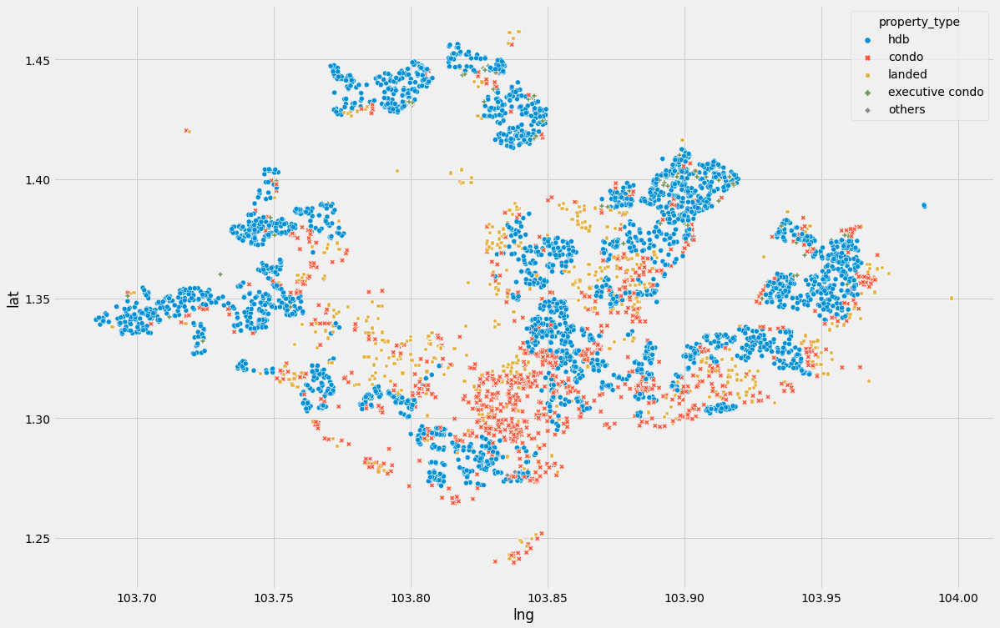

In [146]:
plt.figure(figsize=(18,12))
plt.style.use("fivethirtyeight")
map1 = sns.scatterplot(x=train_df.lng,y=train_df.lat,hue=train_df.property_type,style=train_df.property_type,)

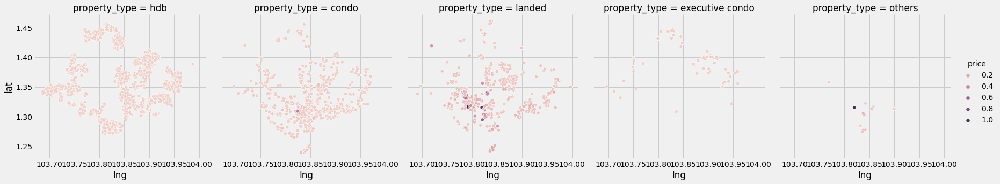

In [147]:
plt.style.use("fivethirtyeight")
map3=sns.relplot(
    data=train_df, x="lng", y="lat",
    col="property_type", hue="price",
    kind="scatter"
)

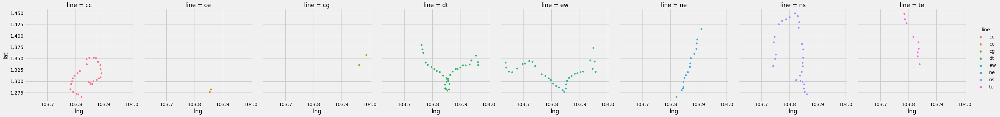

In [154]:
plt.style.use("fivethirtyeight")
map3=sns.relplot(
    data=mrt_df, x="lng", y="lat",
    col="line", hue="line",
    kind="scatter"
)

# References 

1. https://towardsdatascience.com/predicting-singapore-hdb-resale-price-eda-and-modeling-94af7d26798d
2. https://medium.com/swlh/web-scrapping-and-data-analysis-of-condominium-rental-market-in-singapore-da5265c71d19
3. https://www.iproperty.com.sg/news/types-of-housing-in-singapore/
4. https://www.99.co/singapore/insider/leasehold-property-99-years/